In [ ]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

adnanroshidshawon_final_run_2_input_path = kagglehub.dataset_download('adnanroshidshawon/final-run-2-input')

print('Data source import complete.')


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
import catboost as cb
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import optuna
from optuna import Trial
import os

# Step 1: Load the dataset
file_path = '/kaggle/input/final-run-2-input/Final Dataset with Tempering.xlsx'
df = pd.read_excel(file_path)

# Step 2: Fill empty cells with zeros
df.fillna(0, inplace=True)

# Step 3: Show head, data types and description
print(df.head())
print(df.dtypes)
print(df.describe())

# Step 4: Drop columns 'Alloy name', 'Ultimate Tensile Strength', 'Yield Strength (MPa)'
df_reduced = df.drop(columns=['Alloy name', 'Ultimate Tensile Strength', 'Yield Strength (MPa)'])

# Step 5: Ensure all values in the 'Tempering' column are consistent and then apply label encoding
df_reduced['Tempering'] = df_reduced['Tempering'].astype(str)  # Convert all to string

# Apply LabelEncoder
encoder = LabelEncoder()
df_reduced['Tempering'] = encoder.fit_transform(df_reduced['Tempering'])

# Step 6: Draw a Spearman correlation heatmap with Blues
corr = df_reduced.corr(method='spearman')
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
plt.title('Spearman Correlation Heatmap')
plt.savefig('/kaggle/working/spearman_correlation_heatmap.png', dpi=500)
plt.show()

# Step 7: Feature importance comparison using Spearman and Pearson
spearman_corr = corr['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)

# Plot both correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Comparison of Feature Importance to Target')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/correlation_comparison.png', dpi=500)
plt.show()

# Step 8: Eliminate poorly correlated features (correlation < |0.001|)
low_corr_features = corr.columns[abs(corr['Thermal Conductivity (W/m-K)']) < 0.001]
df_reduced = df_reduced.drop(columns=low_corr_features)

# Step 9: Show new dataset with their datatype
print(df_reduced.dtypes)

# Step 10: Find Spearman and Pearson correlations with the target variable
spearman_corr = df_reduced.corr(method='spearman')['Thermal Conductivity (W/m-K)']
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)']

# Plot correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Feature Correlations with Target Variable')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/feature_correlation_target.png', dpi=500)
plt.show()

# Save Spearman and Pearson values to CSV
corr_df = pd.DataFrame({'Spearman': spearman_corr, 'Pearson': pearson_corr})
corr_df.to_csv('/kaggle/working/feature_correlations.csv', index=True)

# Step 11: Split the data into training and testing sets
X = df_reduced.drop(columns=['Thermal Conductivity (W/m-K)'])
y = df_reduced['Thermal Conductivity (W/m-K)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 12: Define all models
models = {
    'XGBoost': xgb.XGBRegressor(),
    'CatBoost': cb.CatBoostRegressor(verbose=0),
    'Gradient Boosting': GradientBoostingRegressor(),
    'Stacking Ensemble': StackingRegressor(estimators=[
        ('rf', RandomForestRegressor()),
        ('dt', DecisionTreeRegressor())
    ], final_estimator=LinearRegression()),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'AdaBoost': AdaBoostRegressor(),
    'K-Nearest Neighbor': KNeighborsRegressor(),
    'Linear Regression': LinearRegression(),
}

# Step 13: Hyperparameter tuning with Optuna for all models
def objective(trial: Trial, model_name: str):
    if model_name == 'XGBoost':
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        }
        model = xgb.XGBRegressor(**param)
    elif model_name == 'CatBoost':
        param = {
            'iterations': trial.suggest_int('iterations', 100, 1000),
            'depth': trial.suggest_int('depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        }
        model = cb.CatBoostRegressor(**param, verbose=0)
    elif model_name == 'Gradient Boosting':
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        }
        model = GradientBoostingRegressor(**param)
    elif model_name == 'Stacking Ensemble':
        param = {}  # Stacking model does not have specific parameters
        model = StackingRegressor(estimators=[
            ('rf', RandomForestRegressor()),
            ('dt', DecisionTreeRegressor())
        ], final_estimator=LinearRegression())
    elif model_name == 'Decision Tree':
        param = {
            'max_depth': trial.suggest_int('max_depth', 3, 15),
        }
        model = DecisionTreeRegressor(**param)
    elif model_name == 'Random Forest':
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300),
            'max_depth': trial.suggest_int('max_depth', 3, 15),
        }
        model = RandomForestRegressor(**param)
    elif model_name == 'AdaBoost':
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        }
        model = AdaBoostRegressor(**param)
    elif model_name == 'K-Nearest Neighbor':
        param = {
            'n_neighbors': trial.suggest_int('n_neighbors', 3, 20),
        }
        model = KNeighborsRegressor(**param)
    elif model_name == 'Linear Regression':
        param = {}  # Linear Regression doesn't need tuning
        model = LinearRegression()

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    return rmse

# Perform hyperparameter tuning for all models
best_params = {}
for model_name in models.keys():
    study = optuna.create_study(direction='minimize')
    study.optimize(lambda trial: objective(trial, model_name), n_trials=100)
    best_params[model_name] = study.best_params
    print(f"Best params for {model_name}: {best_params[model_name]}")

# Save the best hyperparameters
pd.DataFrame(best_params).to_csv('/kaggle/working/best_hyperparameters.csv', index=False)

# Step 14: Train models with best hyperparameters
best_models = {}
for model_name, model in models.items():
    model.set_params(**best_params[model_name])  # Set the best hyperparameters
    model.fit(X_train, y_train)
    best_models[model_name] = model

# Step 15: Evaluate models
eval_results = []
for model_name, model in best_models.items():
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    eval_results.append([model_name, r2, rmse, mae])

eval_results_df = pd.DataFrame(eval_results, columns=['Model', 'R²', 'RMSE', 'MAE'])
eval_results_df.to_csv('/kaggle/working/model_evaluations.csv', index=False)

# Step 16: Performance scatter plot (Predicted vs Actual for each model)
for model_name, model in best_models.items():
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    # Create the plot
    plt.figure(figsize=(8, 6))

    # Plot actual values in red
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.6)

    # Plot predicted values in blue
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.6)

    # Plot the diagonal line (perfect prediction)
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')

    # Add labels and title
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Predicted vs Actual - {model_name}')

    # Display R², RMSE, and MAE values on the plot
    plt.text(0.05, 0.95, f'R²: {r2:.2f}\nRMSE: {rmse:.2f}\nMAE: {mae:.2f}',
             transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', color='black')


    # Save the plot
    plt.savefig(f'/kaggle/working/predicted_vs_actual_{model_name}.png', dpi=500)
    plt.show()



After getting the best **hyperparameters** in our RUN. We loaded it into the next code to get a similar result each time

  Alloy name Tempering  Thermal Conductivity (W/m-K)  \
0   1050-H14       H14                         227.0   
1   1050-H16       H16                         227.0   
2   1050-H18       H18                         227.0   
3     1050-O         O                         231.0   
4  1060-H112      H112                         234.0   

   Ultimate Tensile Strength  Yield Strength (MPa)  Aluminum , AI  \
0                      110.0                 103.0           99.5   
1                      131.0                 124.0           99.5   
2                      160.0                 145.0           99.5   
3                       76.0                  28.0           99.5   
4                       76.5                  17.0           99.6   

   Silicon, Si  Copper, Cu  Iron, Fe  Magnesium, Mg  Zinc, Zn  Manganese, Mn  \
0         0.25        0.05      0.40           0.05      0.05           0.05   
1         0.25        0.05      0.40           0.05      0.05           0.05   
2       

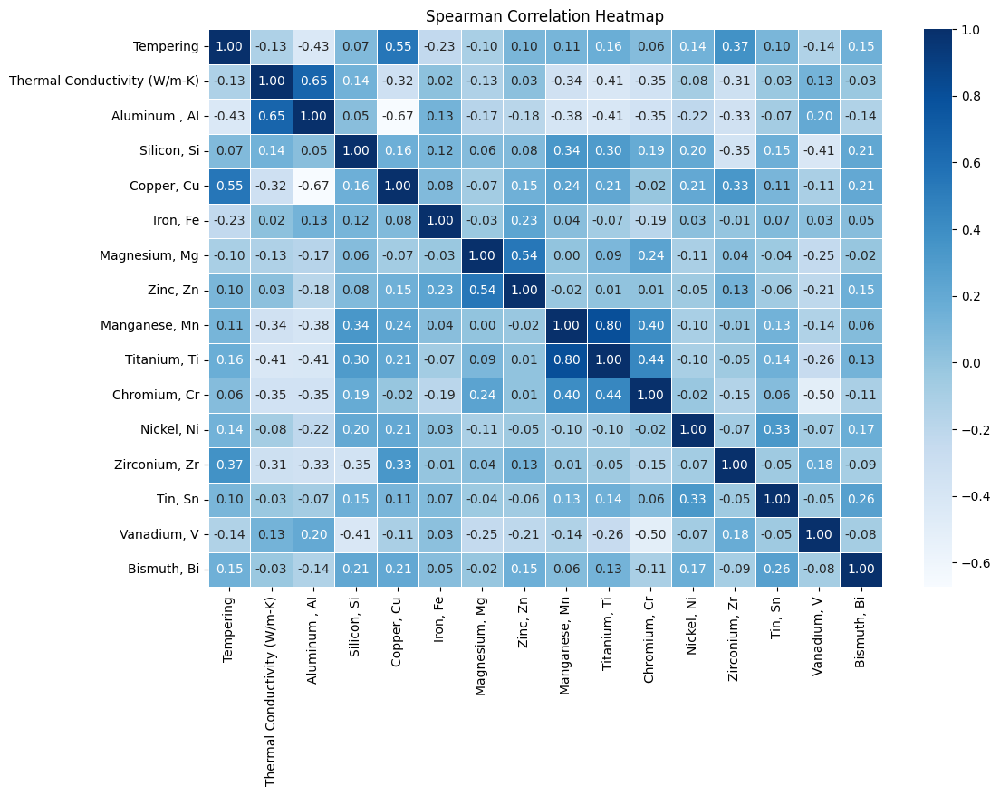

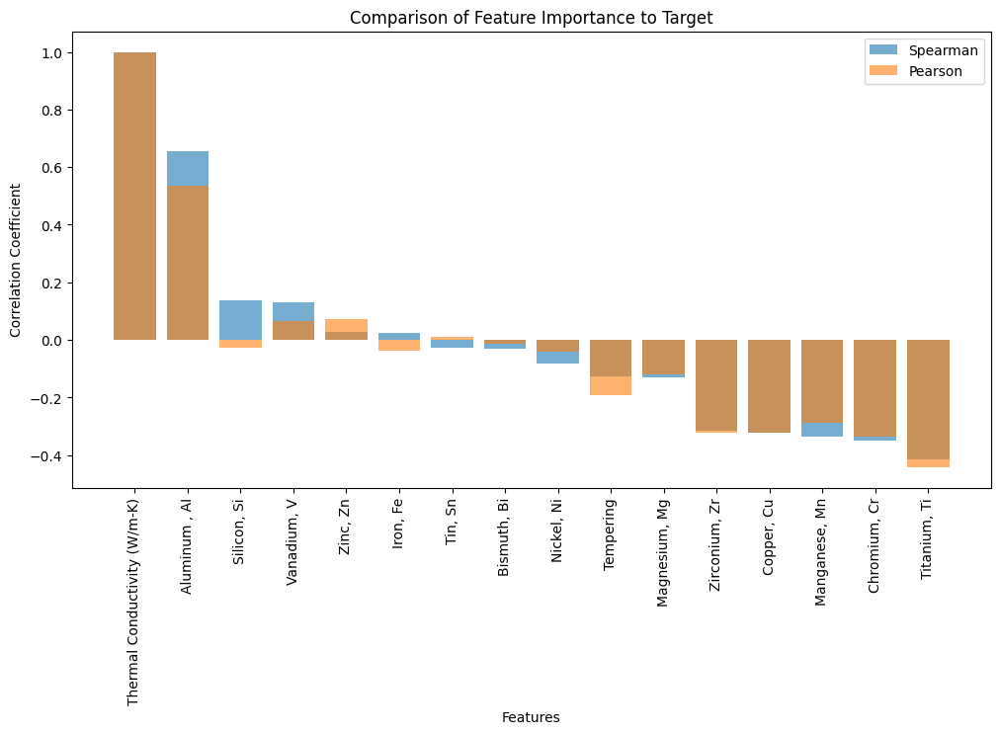

Tempering                         int64
Thermal Conductivity (W/m-K)    float64
Aluminum , AI                   float64
Silicon, Si                     float64
Copper, Cu                      float64
Iron, Fe                        float64
Magnesium, Mg                   float64
Zinc, Zn                        float64
Manganese, Mn                   float64
Titanium, Ti                    float64
Chromium, Cr                    float64
Nickel, Ni                      float64
Zirconium, Zr                   float64
Tin, Sn                         float64
Vanadium, V                     float64
Bismuth, Bi                     float64
dtype: object


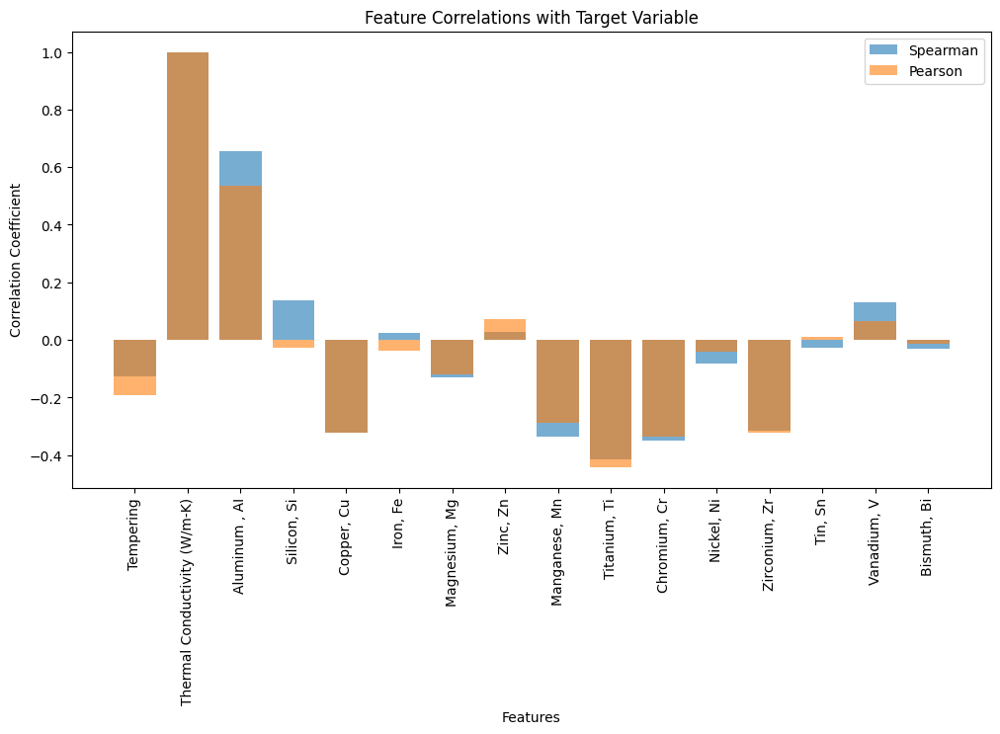

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
import catboost as cb
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import os

# Step 1: Load the dataset
file_path = '/kaggle/input/final-run-2-input/Final Dataset with Tempering.xlsx'
df = pd.read_excel(file_path)

# Step 2: Fill empty cells with zeros
df.fillna(0, inplace=True)

# Step 3: Show head, data types and description
print(df.head())
print(df.dtypes)
print(df.describe())

# Step 4: Drop columns 'Alloy name', 'Ultimate Tensile Strength', 'Yield Strength (MPa)'
df_reduced = df.drop(columns=['Alloy name', 'Ultimate Tensile Strength', 'Yield Strength (MPa)'])

# Step 5: Ensure all values in the 'Tempering' column are consistent and then apply label encoding
df_reduced['Tempering'] = df_reduced['Tempering'].astype(str)  # Convert all to string

# Apply LabelEncoder
encoder = LabelEncoder()
df_reduced['Tempering'] = encoder.fit_transform(df_reduced['Tempering'])

# Step 6: Draw a Spearman correlation heatmap with Blues
corr = df_reduced.corr(method='spearman')
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
plt.title('Spearman Correlation Heatmap')
plt.savefig('/kaggle/working/spearman_correlation_heatmap.png', dpi=500)
plt.show()

# Step 7: Feature importance comparison using Spearman and Pearson
spearman_corr = corr['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)

# Plot both correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Comparison of Feature Importance to Target')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/correlation_comparison.png', dpi=500)
plt.show()

# Step 8: Eliminate poorly correlated features (correlation < |0.001|)
low_corr_features = corr.columns[abs(corr['Thermal Conductivity (W/m-K)']) < 0.001]
df_reduced = df_reduced.drop(columns=low_corr_features)

# Step 9: Show new dataset with their datatype
print(df_reduced.dtypes)

# Step 10: Find Spearman and Pearson correlations with the target variable
spearman_corr = df_reduced.corr(method='spearman')['Thermal Conductivity (W/m-K)']
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)']

# Plot correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Feature Correlations with Target Variable')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/feature_correlation_target.png', dpi=500)
plt.show()

# Save Spearman and Pearson values to CSV
corr_df = pd.DataFrame({'Spearman': spearman_corr, 'Pearson': pearson_corr})
corr_df.to_csv('/kaggle/working/feature_correlations.csv', index=True)

# Step 11: Split the data into training and testing sets
X = df_reduced.drop(columns=['Thermal Conductivity (W/m-K)'])
y = df_reduced['Thermal Conductivity (W/m-K)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 12: Define all models with predefined hyperparameters from the CSV file
models = {
    'XGB': xgb.XGBRegressor(n_estimators=237, max_depth=3, learning_rate=0.225906),
    'CB': cb.CatBoostRegressor(iterations=994, depth=3, learning_rate=0.115836, verbose=0),
    'GB': GradientBoostingRegressor(n_estimators=282, max_depth=3, learning_rate=0.087842),
    'SE': StackingRegressor(estimators=[
        ('rf', RandomForestRegressor()),
        ('dt', DecisionTreeRegressor())
    ], final_estimator=LinearRegression()),
    'DT': DecisionTreeRegressor(max_depth=13),
    'RF': RandomForestRegressor(n_estimators=99, max_depth=14),
    'AB': AdaBoostRegressor(n_estimators=197, learning_rate=0.151225),
    'KNN': KNeighborsRegressor(n_neighbors=3),
    'LR': LinearRegression(),
}

# Step 13: Train models with predefined hyperparameters
best_models = {}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    best_models[model_name] = model

# Step 14: Evaluate models
eval_results = []
for model_name, model in best_models.items():
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    eval_results.append([model_name, r2, rmse, mae])

eval_results_df = pd.DataFrame(eval_results, columns=['Model', 'R²', 'RMSE', 'MAE'])
eval_results_df.to_csv('/kaggle/working/model_evaluations.csv', index=False)

# Loop through the models in best_models
for model_name, model in best_models.items():
    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    # Create the plot with high resolution
    plt.figure(figsize=(10, 8), dpi=1000)  # High resolution (1000 dpi for clarity)

    # Scatter plot for actual vs predicted
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.8, s=200)
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.8, s=200)

    # Plot the diagonal line (perfect prediction) with a solid line
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='-', label='Perfect Prediction', linewidth=3)
    # Add labels and title with Times New Roman font, bold, and slightly larger size
    plt.xlabel('Actual TC', fontsize=22, fontweight='bold', fontname='Times New Roman')
    plt.ylabel('Predicted TC', fontsize=22, fontweight='bold', fontname='Times New Roman')
    plt.title(f'{model_name}', fontsize=24, fontweight='bold', fontname='Times New Roman')

    # Display R², RMSE, and MAE values on the plot
    plt.text(0.05, 0.95, f'R²: {r2:.2f}\nRMSE: {rmse:.2f}\nMAE: {mae:.2f}',
             transform=plt.gca().transAxes, fontsize=20, fontweight='bold', verticalalignment='top', color='black', fontname='Times New Roman')

    # Make axis rule scaling numbers bold and larger
    plt.xticks(fontsize=16, fontweight='bold')  # Set x-axis tick labels to larger size and bold
    plt.yticks(fontsize=16, fontweight='bold')  # Set y-axis tick labels to larger size and bold

    # Save the plot with the highest resolution (1000 dpi)
    plt.savefig(f'predicted_vs_actual_{model_name}.png', dpi=1000)  # Saving at 1000 dpi
    plt.show()

    # Save the data (actual vs predicted) to a CSV file
    plot_data = pd.DataFrame({
        'Actual': y_test,
        'Predicted': y_pred
    })
    plot_data.to_csv(f'predicted_vs_actual_{model_name}.csv', index=False)
